##### 3.5.4 Comparing and evaluating clustering algorithms
##### Evaluating clustering with ground truth
- 훈련 데이터에 대한 Target을 알고 있을 때 Clustering Algorithm 평가방법
  - ARI (Adjusted Rand Index)
    - adjusted_rand_score(y, predicted_clusters)
    - 무작위 클러스터링: 0
    - 1에 가까운 값일수록 타깃과 더 유사한 클러스터링 결과
  - NMI (Normalized Mutual Information)
    - normalized_mutual_infro_score(y, predicted_clusters)  
    - 무작위 클러스터링: 0
    - 1에 가까운 값일수록 타깃과 더 유사한 클러스터링 결과    

In [131]:
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

- ARI (Adjusted Rand Index)

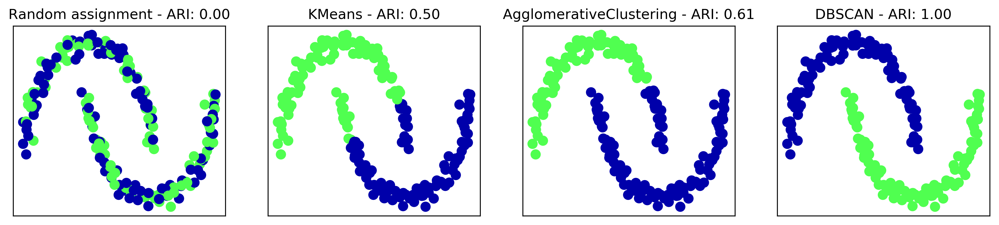

In [132]:
from sklearn.metrics.cluster import adjusted_rand_score

fig, axes = plt.subplots(1, 4, figsize=(15, 3), subplot_kw={'xticks': (), 'yticks': ()})

# make a list of algorithms to use
algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2), DBSCAN()]

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters, cmap=mglearn.cm3, s=60)
axes[0].set_title("Random assignment - ARI: {:.2f}".format(adjusted_rand_score(y, random_clusters)))

for ax, algorithm in zip(axes[1:], algorithms):
    # plot the cluster assignments and cluster centers
    clusters = algorithm.fit_predict(X_scaled)
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3, s=60)
    ax.set_title("{} - ARI: {:.2f}".format(algorithm.__class__.__name__, adjusted_rand_score(y, clusters)))

- NMI (Normalized Mutual Information)

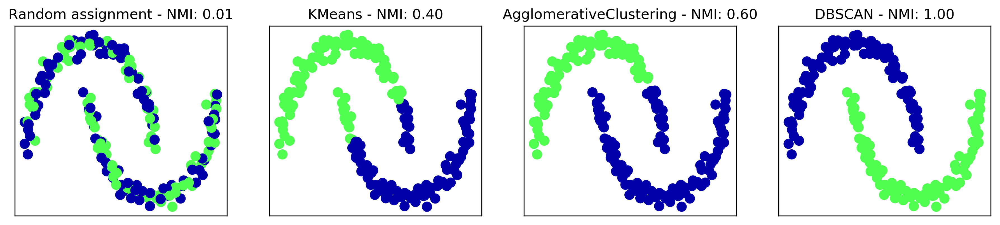

In [133]:
from sklearn.metrics.cluster import normalized_mutual_info_score

fig, axes = plt.subplots(1, 4, figsize=(15, 3), subplot_kw={'xticks': (), 'yticks': ()})

# make a list of algorithms to use
algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2), DBSCAN()]

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters, cmap=mglearn.cm3, s=60)
axes[0].set_title("Random assignment - NMI: {:.2f}".format(normalized_mutual_info_score(y, random_clusters)))

for ax, algorithm in zip(axes[1:], algorithms):
    # plot the cluster assignments and cluster centers
    clusters = algorithm.fit_predict(X_scaled)
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3, s=60)
    ax.set_title("{} - NMI: {:.2f}".format(algorithm.__class__.__name__, normalized_mutual_info_score(y, clusters)))

- accuracy_score 는 사용하면 안됨

In [135]:
from sklearn.metrics import accuracy_score

# these two labelings of points correspond to the same clustering
clusters1 = [0, 0, 1, 1, 0]
clusters2 = [1, 1, 0, 0, 1]
# accuracy is zero, as none of the labels are the same
print("Accuracy: {:.2f}".format(accuracy_score(clusters1, clusters2)))

# adjusted rand score is 1, as the clustering is exactly the same:
print("ARI: {:.2f}".format(adjusted_rand_score(clusters1, clusters2)))

# normalized mutual information score is 1, as the clustering is exactly the same:
print("NMI: {:.2f}".format(normalized_mutual_info_score(clusters1, clusters2)))

Accuracy: 0.00
ARI: 1.00
NMI: 1.00


##### Evaluating clustering without ground truth
- 수집한 데이터 자체에 Target 값이 없을 때 클러스터링 알고리즘 성능 평가하기
  - Sihouette Coefficient (실루엣 계수)
    - 그다지 추천하지 않음
    - 클러스터의 밀집정도를 계산함 - 밀집정도가 높을 수록 1에 가까운 값을 반환함.
  - Robustness-based Evaluation (견고성 기반 평가)
    - 데이터에 잡음 포인트를 추가하거나 여러가지 매개변수 설정으로 알고리즘을 실행하여도 클러스터 구성이 변하지 않을 때 해당 클러스터 구성 결과에 높은 신뢰도가 있다고 볼 수 있음
    - scikit-learn에서는 지원하지 않음
  - 사람이 직접 확인하는 방법

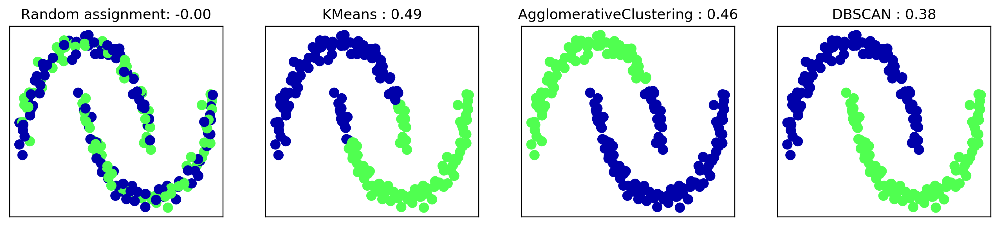

In [136]:
from sklearn.metrics.cluster import silhouette_score

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3), subplot_kw={'xticks': (), 'yticks': ()})

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters, cmap=mglearn.cm3, s=60)
axes[0].set_title("Random assignment: {:.2f}".format(silhouette_score(X_scaled, random_clusters)))

algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2), DBSCAN()]

for ax, algorithm in zip(axes[1:], algorithms):
    clusters = algorithm.fit_predict(X_scaled)
    # plot the cluster assignments and cluster centers
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3, s=60)
    ax.set_title("{} : {:.2f}".format(algorithm.__class__.__name__, silhouette_score(X_scaled, clusters)))

##### Comparing algorithms on the faces dataset
- LFW 데이터셋에 대한 k-means, DBSCAN, Agglomerative Clustering 적용 결과 비교
- LFW 데이터셋에 대하여 PCA 적용하여 주성분 100개의 얼굴데이터 활용

In [137]:
# extract eigenfaces from lfw data and transform data
from sklearn.decomposition import PCA
pca = PCA(n_components=100, whiten=True, random_state=0)
pca.fit_transform(X_people)
X_pca = pca.transform(X_people)

##### Analyzing the faces dataset with DBSCAN

- eps=0.5, min_samples=5

In [140]:
# apply DBSCAN with default parameters
dbscan = DBSCAN()
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


- eps=0.5, min_samples=3

In [141]:
dbscan = DBSCAN(min_samples=3)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


- eps=15, min_samples=3

In [142]:
dbscan = DBSCAN(min_samples=3, eps=15)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1  0]


- 잡음 포인트와 클러스터로 분류된 포인트의 개수를 카운트
- np.bincount 활용
  - np.bincount는 음수를 허용하지 않기 때문에 1을 더하여 활용 
  - 잡음 포인트: 31개
  - 클러스터로 분류된 포인트: 1945개

In [143]:
# count number of points in all clusters and noise.
# bincount doesn't allow negative numbers, so we need to add 1.
# the first number in the result corresponds to noise points
print("Number of points per cluster: {}".format(np.bincount(labels + 1)))

Number of points per cluster: [  31 1945]


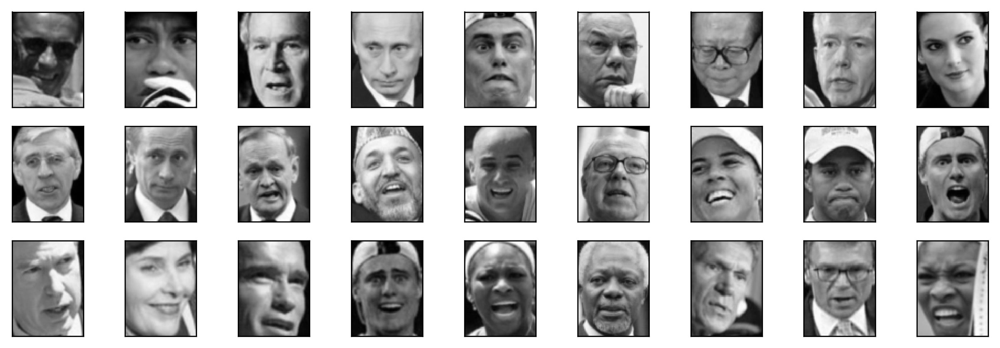

In [144]:
noise = X_people[labels==-1]

fig, axes = plt.subplots(3, 9, subplot_kw={'xticks': (), 'yticks': ()}, figsize=(12, 4))
for image, ax in zip(noise, axes.ravel()):
    ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)

- 잡음으로 분류된 이유 추정
  - 손이 얼굴 앞을 가리고 있는 경우
  - 얼굴 각도가 이상한 경우
  - 얼굴을 너무 가까이서 혹은 너무 멀리서 자른 경우
- Outlier Detection (이상치 검출)

- eps 값을 줄여서 더 많은 클러스터 구성하기

In [78]:
for eps in [1, 3, 5, 7, 9, 11, 13]:
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(X_pca)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=1
Number of clusters: 1
Cluster sizes: [1976]

eps=3
Number of clusters: 1
Cluster sizes: [1976]

eps=5
Number of clusters: 1
Cluster sizes: [1976]

eps=7
Number of clusters: 9
Cluster sizes: [1920   19   14    3    3    3    7    3    4]

eps=9
Number of clusters: 5
Cluster sizes: [1212  754    3    4    3]

eps=11
Number of clusters: 2
Cluster sizes: [ 393 1583]

eps=13
Number of clusters: 2
Cluster sizes: [ 118 1858]


- DBSCAN의 단점
  - 클러스터의 개수 컨트롤을 직접적으로 할 수 없음
  - 사이즈가 큰 하나의 클러스터가 항상 생성되고 있음

Cluster: 0, n_images: 19
Cluster: 1, n_images: 14
Cluster: 2, n_images: 3
Cluster: 3, n_images: 3
Cluster: 4, n_images: 3
Cluster: 5, n_images: 7
Cluster: 6, n_images: 3
Cluster: 7, n_images: 4


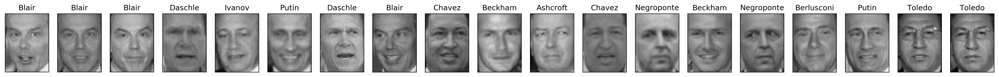

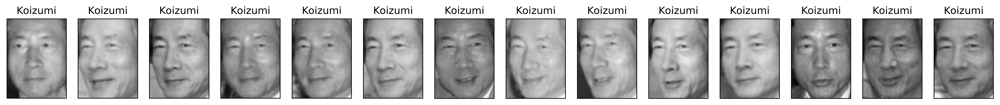

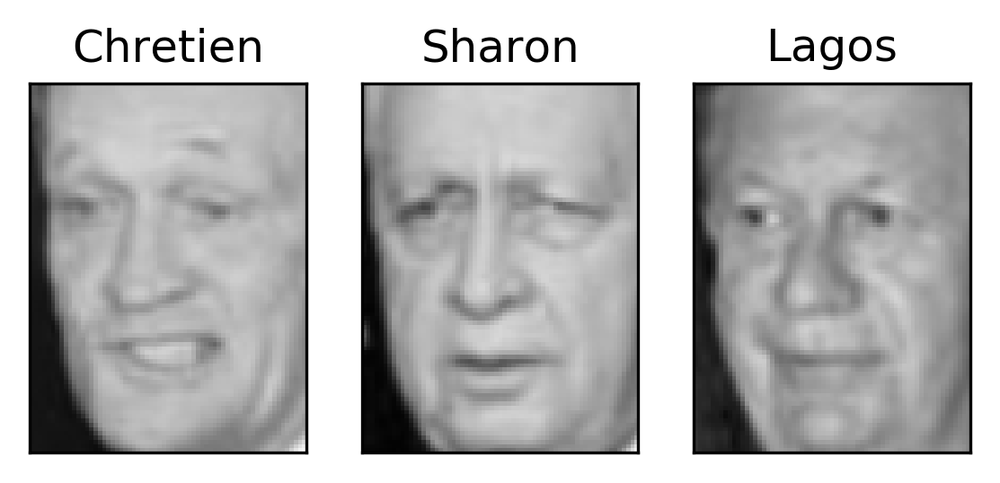

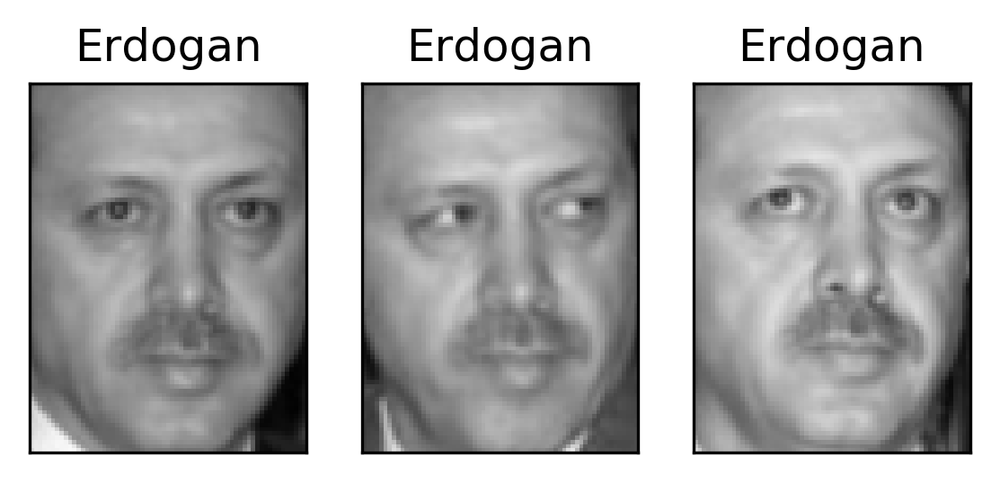

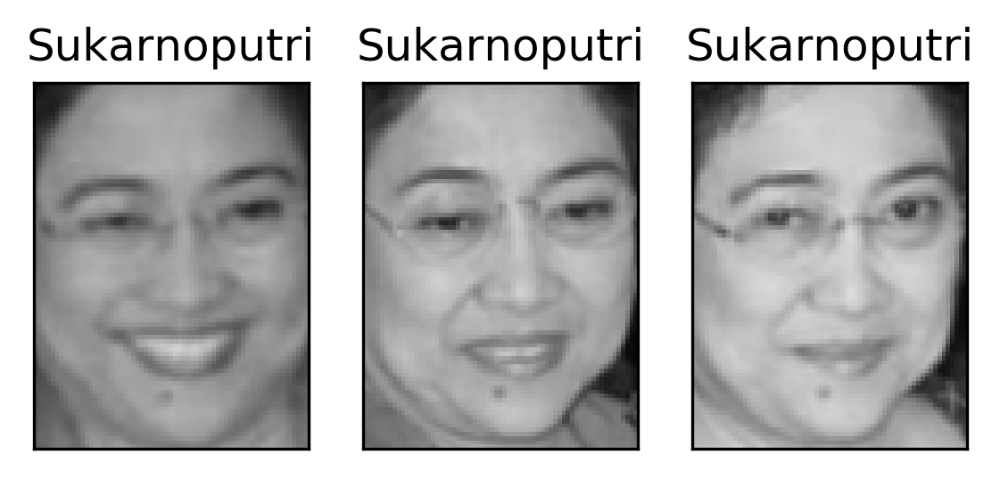

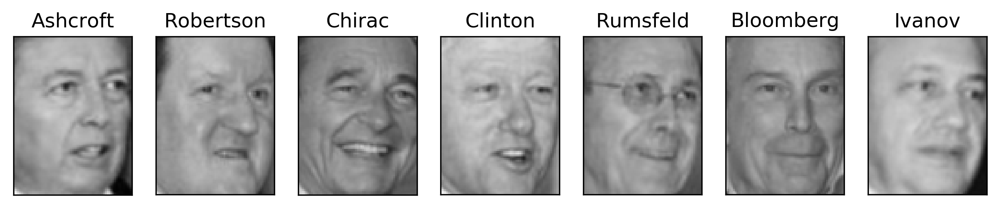

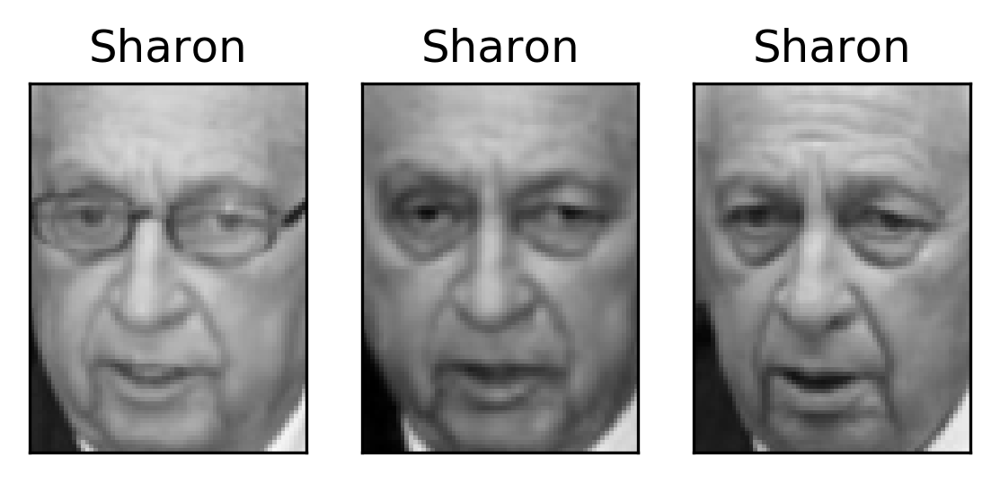

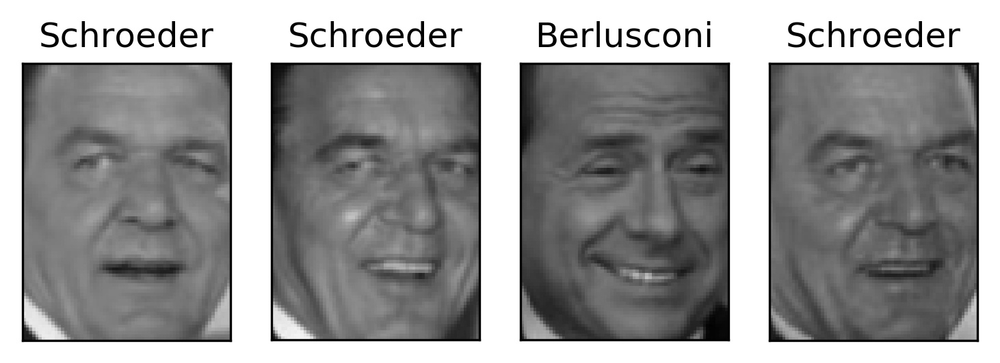

In [146]:
dbscan = DBSCAN(min_samples=3, eps=7)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images = np.sum(mask)
    print("Cluster: {0}, n_images: {1}".format(cluster, n_images))
    
    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 1.5, 4), subplot_kw={'xticks': (), 'yticks': ()})
    for image, label, ax in zip(X_people[mask], y_people[mask], axes):
        ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)
        ax.set_title(people.target_names[label].split()[-1])

##### Analyzing the faces dataset with k-Means

In [80]:
# extract clusters with k-Means
km = KMeans(n_clusters=10, random_state=0)
labels_km = km.fit_predict(X_pca)
print("Cluster sizes k-means: {}".format(np.bincount(labels_km)))

Cluster sizes k-means: [191 243 130 218 298 114 296  85 147 254]


- k-means 클러스터 center 10개를 원본 이미지로 inverse_transform 하여 시각화하기

km.cluster_centers_.shape: (10, 100)
pca.inverse_transform(center).shape:  (5655,)


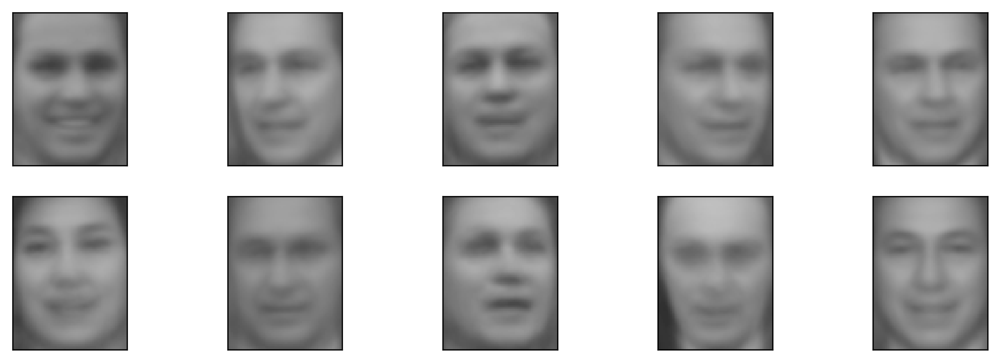

In [151]:
fig, axes = plt.subplots(2, 5, subplot_kw={'xticks': (), 'yticks': ()}, figsize=(12, 4))

print("km.cluster_centers_.shape:", km.cluster_centers_.shape)
print("pca.inverse_transform(center).shape: ", pca.inverse_transform(center).shape)
for center, ax in zip(km.cluster_centers_, axes.ravel()):
    ax.imshow(pca.inverse_transform(center).reshape(image_shape), vmin=0, vmax=1)

- 위 center 이미지는 각 클러스터에 속한 얼굴 이미지의 평균이라고 간주해야 함
- 특히 PCA를 사용하여 감소된 특성과 함께 k-means를 적용했기 때문에 각 이미지가 더욱 부드러워졌음
- 각 center 이미지는 각기 다른 얼굴 각도와 다른 표정을 지니고 있다고 볼 수 있음

- 각 클러스터 10개에 대하여 가장 대표적인 이미지 5개와 가장 동떨어진 이미지 5개 시각화하기

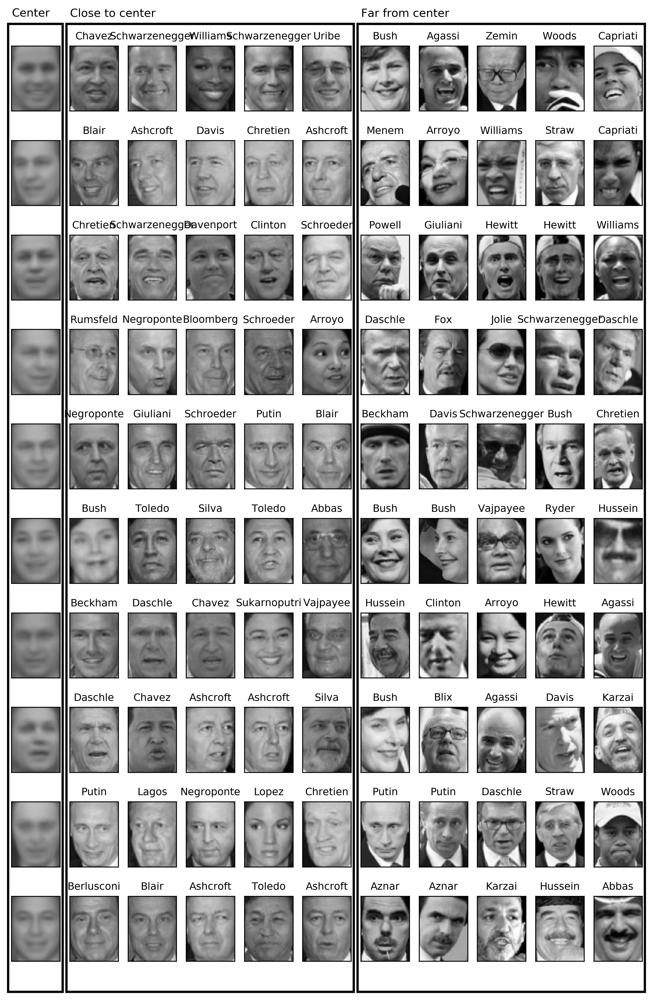

In [82]:
mglearn.plots.plot_kmeans_faces(km, pca, X_pca, X_people, y_people, people.target_names)

##### Analyzing the faces dataset with agglomerative clustering

In [152]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

cluster sizes agglomerative clustering: [ 99 493 345 140  25 154  58  35 601  26]


- k-means 클러스터링 결과와 AgglomerativeClustering 클러스터링 결과를 ARI 도구를 활용하여 비교 평가하기 
  - 결과값: 0.13 - 공통 부분이 거의 없다고 볼 수 있음

In [155]:
print("ARI: {:.2f}".format(adjusted_rand_score(labels_agg, labels_km)))

ARI: 0.13


- Dendrogram 그리기 
  - 트리 깊이 제한
    - p=7, truncate_mode='level'
      - 최대 level을 7로 제한

Text(0,0.5,'Cluster distance')

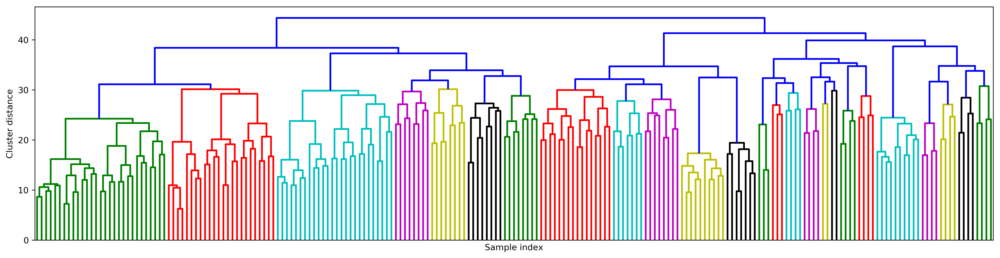

In [85]:
linkage_array = ward(X_pca)
# now we plot the dendrogram for the linkage_array
# containing the distances between clusters
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode='level', no_labels=True)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

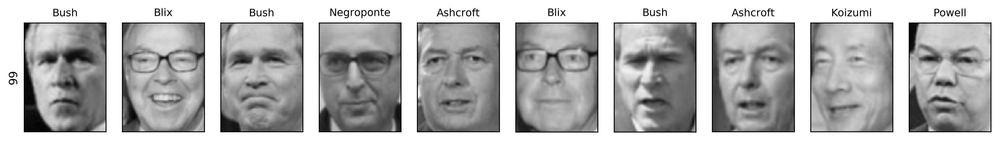

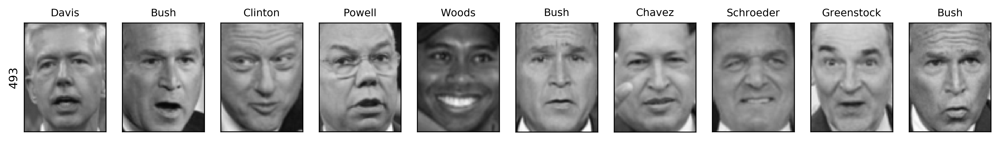

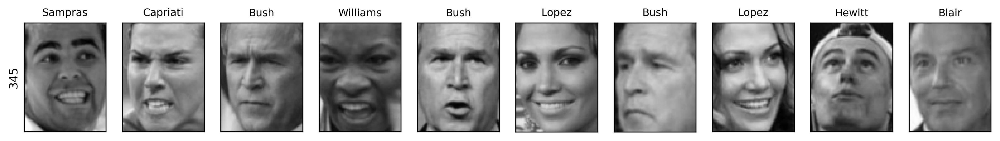

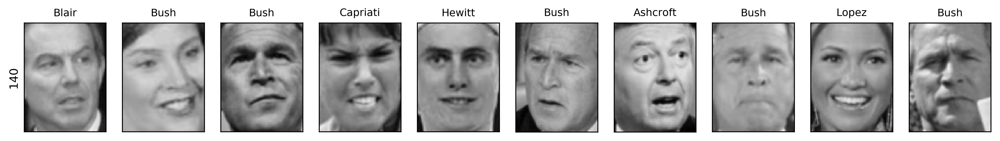

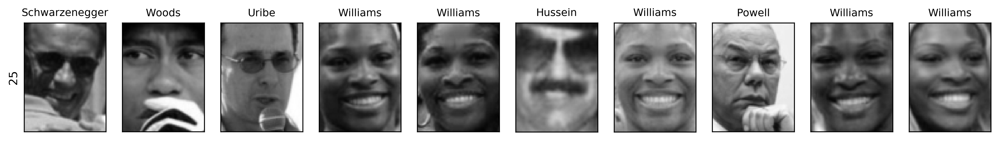

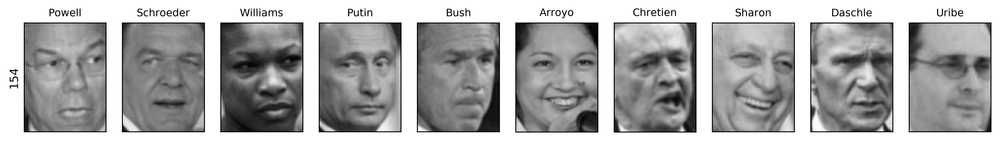

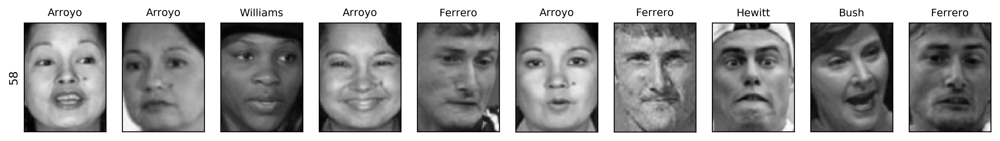

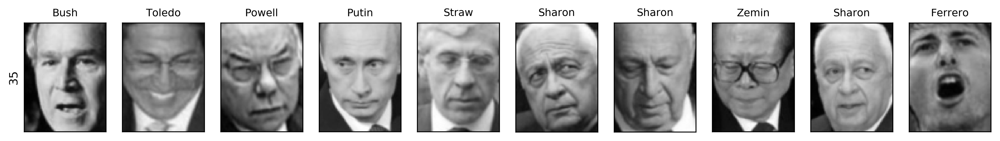

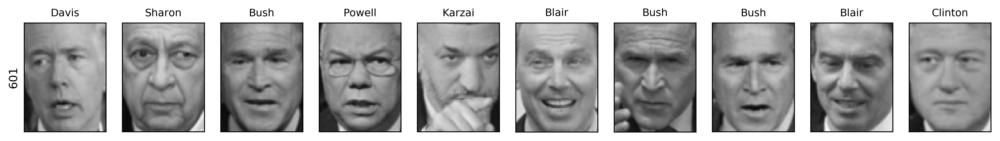

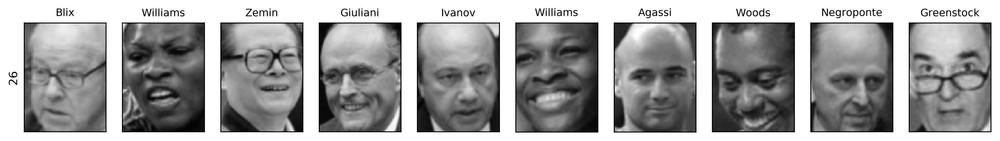

In [86]:
n_clusters = 10

for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 10, subplot_kw={'xticks': (), 'yticks': ()}, figsize=(15, 8))
    axes[0].set_ylabel(np.sum(mask))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask], labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)
        ax.set_title(people.target_names[label].split()[-1], fontdict={'fontsize': 9})

cluster sizes agglomerative clustering: [ 44 247  26  54 175  94 128  96  42  86   5  19   8  61  89  15  29  66
  38  26  26  17  35  94  44  22   9  74  36  28  25  77  12  20  23   9
  14   3  50  10]


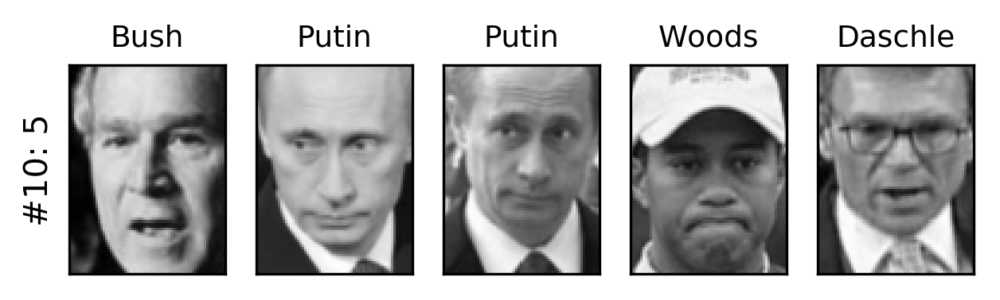

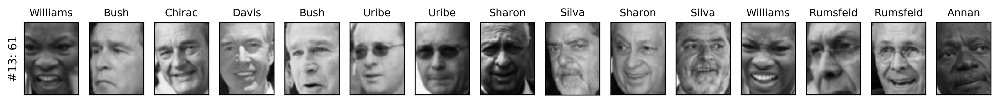

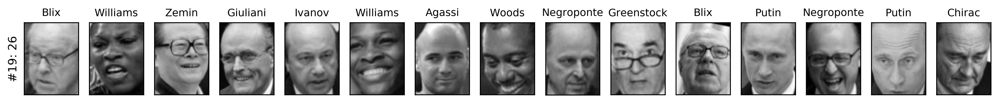

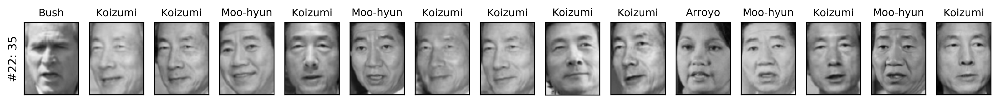

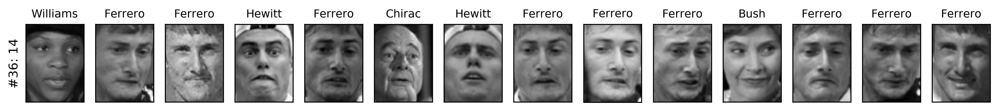

In [87]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

n_clusters = 40
for cluster in [10, 13, 19, 22, 36]: # hand-picked "interesting" clusters
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 15, subplot_kw={'xticks': (), 'yticks': ()}, figsize=(15, 8))
    cluster_size = np.sum(mask)
    axes[0].set_ylabel("#{}: {}".format(cluster, cluster_size))

    for image, label, asdf, ax in zip(X_people[mask], y_people[mask], labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)
        ax.set_title(people.target_names[label].split()[-1], fontdict={'fontsize': 9})

    for i in range(cluster_size, 15):
        axes[i].set_visible(False)

#### Summary of Clustering Methods
- k-means
  - 장점
    - 클러스터의 Center를 명확히 짚어낼 수 있음 
- agglomerative clustering
  - 장점
    - 전체 데이터의 분할 계층도인 Dendrogram 시각화 가능
- DBSCAN
  - 장점
    - 클러스터에 속하지 않은 잡음 포인트를 인식할 수 있음
    - 클러스터 개수가 자동으로 결정됨
    - 복잡한 모양의 클러스터 형태 구분 가능

### Summary and Outlook
- Estimator (추정기)
  - scikit-learn에서 학 학습 모델 및 알고리즘을 포함하고 있는 클래스

In [88]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

- Estimator 모델 객체 구성시 지정하는 매개변수
  - 규제
  - 복잡도 제어
  - 클러스터 개수
- Estimator.fit
  - 모델 구성
  - 첫번째 매개변수로 훈련 데이터 X 필요
  - 지도 학습일 때에는 두 번째 매개변수로 타깃 데이터 y 지정 필요
- Estimator.predict
  - 새로운 타깃 예측 데이터 y_pred 생성
- Estimator.transform
  - 입력 데이터 X의 새로운 표현 형태 생성

![api_table](images/api_table.png)